#  Практическое занятие по временным рядам 
## Анализ данных о прокате велосипедов в Сан-Франциско


In [144]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from matplotlib import pyplot as plt
%matplotlib inline
from datetime import datetime, date
from scipy import stats

In [2]:
from warnings import filterwarnings
filterwarnings("ignore")

In [3]:
import plotly.graph_objs as go
import plotly.offline as po
from plotly import tools
# or just these two functions
from plotly.offline import iplot, init_notebook_mode

In [4]:
init_notebook_mode(connected=False)

In [5]:
df = pd.read_csv('bike_sharing_demand.csv', parse_dates=['datetime'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
datetime      10886 non-null datetime64[ns]
season        10886 non-null int64
holiday       10886 non-null int64
workingday    10886 non-null int64
weather       10886 non-null int64
temp          10886 non-null float64
atemp         10886 non-null float64
humidity      10886 non-null int64
windspeed     10886 non-null float64
casual        10886 non-null int64
registered    10886 non-null int64
count         10886 non-null int64
dtypes: datetime64[ns](1), float64(3), int64(8)
memory usage: 1020.6 KB


In [6]:
df.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1


**Data Fields**

**datetime** - hourly date + timestamp  
**season** -  1 = spring, 2 = summer, 3 = fall, 4 = winter  
**holiday** - whether the day is considered a holiday  
**workingday** - whether the day is neither a weekend nor holiday  
**weather** - 1: Clear, Few clouds, Partly cloudy, Partly cloudy  
2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist  
3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds  
4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog  
**temp** - temperature in Celsius  
**atemp** - "feels like" temperature in Celsius  
**humidity** - relative humidity  
**windspeed** - wind speed  
**casual** - number of non-registered user rentals initiated  
**registered** - number of registered user rentals initiated  
**count** - number of total rentals  

In [7]:
df['date'] = df['datetime'].apply(lambda x: pd.to_datetime(datetime.date(x)))

In [106]:
df.head(5)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,date
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16,2011-01-01
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40,2011-01-01
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32,2011-01-01
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13,2011-01-01
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1,2011-01-01


In [108]:
aggregations = {
    'season':'max',
    'holiday': 'max',
    'workingday': 'max',
    'weather': ['min','max'],
    'temp': 'mean',
    'atemp': 'mean',
    'humidity': 'mean',
    'windspeed': 'mean',
    'casual': 'sum',
    'registered' : 'sum',
    'count':'sum'
}

In [109]:
df.groupby('date').agg(aggregations, as_index=False).reset_index().head()

date season holiday workingday weather           temp      atemp  \
                max     max        max     min max       mean       mean   
0 2011-01-01      1       0          0       1   3  14.110833  18.181250   
1 2011-01-02      1       0          0       1   3  14.902609  17.686957   
2 2011-01-03      1       0          1       1   1   8.050909   9.470227   
3 2011-01-04      1       0          1       1   2   8.200000  10.606087   
4 2011-01-05      1       0          1       1   1   9.305217  11.463478   

    humidity  windspeed casual registered count  
        mean       mean    sum        sum   sum  
0  80.583333  10.749871    331        654   985  
1  69.608696  16.652122    131        670   801  
2  43.727273  16.636709    120       1229  1349  
3  59.043478  10.739809    108       1454  1562  
4  43.695652  12.522300     82       1518  1600

In [142]:
df_by_date = df.groupby('date').agg(aggregations, as_index=False).reset_index()

In [144]:
df_by_date.columns = [x[0] if x[0]=='date' else  "_".join(x) for x in df_by_date.columns.ravel()]

In [145]:
df_by_date.head()

,date,season_max,holiday_max,workingday_max,weather_min,weather_max,temp_mean,atemp_mean,humidity_mean,windspeed_mean,casual_sum,registered_sum,count_sum
0,2011-01-01,1,0,0,1,3,14.110833,18.181250,80.583333,10.749871,331,654,985
1,2011-01-02,1,0,0,1,3,14.902609,17.686957,69.608696,16.652122,131,670,801
2,2011-01-03,1,0,1,1,1,8.050909,9.470227,43.727273,16.636709,120,1229,1349
3,2011-01-04,1,0,1,1,2,8.200000,10.606087,59.043478,10.739809,108,1454,1562
4,2011-01-05,1,0,1,1,1,9.305217,11.463478,43.695652,12.522300,82,1518,1600


In [146]:
timed_layout = go.Layout(title='Динамика проката велосипедов в Сан-Франциско')

In [148]:
timed_data = go.Scatter(x = df_by_date['date'], y=df_by_date['count_sum'])

In [149]:
fig = go.Figure(data=[timed_data], layout = timed_layout)

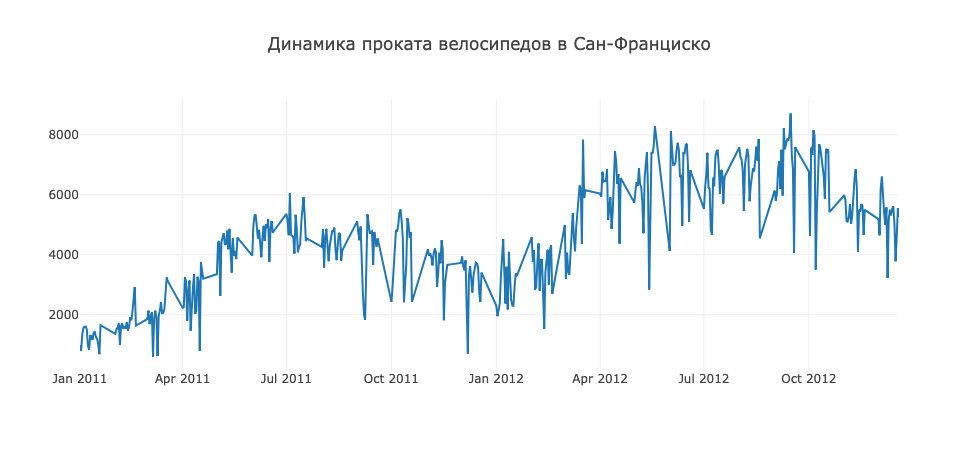

In [150]:
iplot(fig)

In [151]:
df_by_date['days_gap'] = df_by_date['date'] - df_by_date['date'].shift(1)

In [152]:
df_by_date['days_gap'].value_counts()

1 days     432
13 days     13
12 days      8
10 days      1
11 days      1
Name: days_gap, dtype: int64

In [158]:
df_by_date[df_by_date['date'] == pd.Timestamp(date(2012,1,19))]

,date,season_max,holiday_max,workingday_max,weather_min,weather_max,temp_mean,atemp_mean,humidity_mean,windspeed_mean,casual_sum,registered_sum,count_sum,days_gap
246,2012-01-19,1,0,1,1,2,7.79,9.501875,49.75,14.750608,130,3162,3292,1 days


In [10]:
timed_layout = go.Layout(title='Динамика проката велосипедов в Сан-Франциско')

In [160]:
timed_data = go.Scatter(x = df['datetime'], y=df['count'])

In [161]:
fig = go.Figure(data=[timed_data], layout = timed_layout)

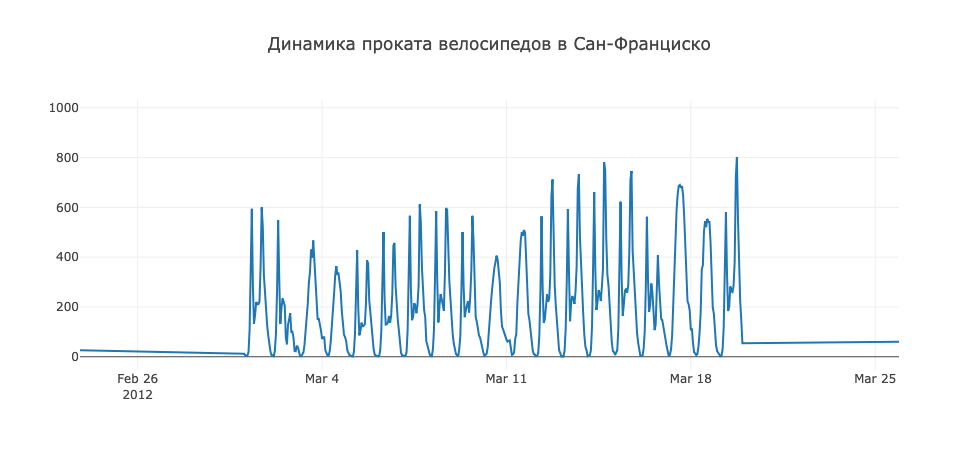

In [162]:
iplot(fig)

In [235]:
bike_rent_data = df[df['date'].isin(pd.date_range(start='2012-03-01', end='2012-03-31'))].reset_index(drop = True)

In [11]:
fig = go.Figure(data=[go.Scatter(x = bike_rent_data['datetime'], y=bike_rent_data['count'])],\
                layout = timed_layout)

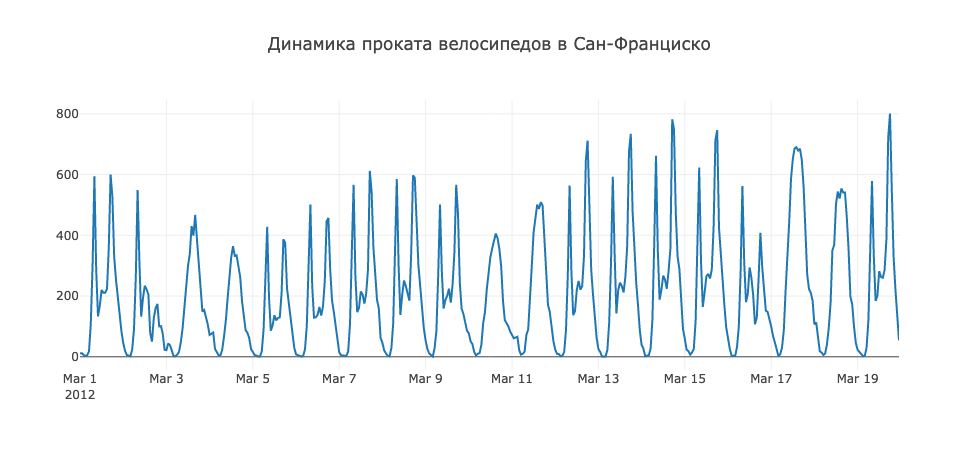

In [12]:
iplot(fig)

In [13]:
bike_rent_data['week_day'] = bike_rent_data['date'].apply(lambda x: x.weekday())

In [14]:
bike_rent_data['hour'] = bike_rent_data['date'].apply(lambda x: x.hour)

In [15]:
bike_rent_data.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,date,week_day,hour
6330,2012-03-01 00:00:00,1,0,1,2,17.22,21.210,94,0.0000,1,10,11,2012-03-01,3,0
6331,2012-03-01 01:00:00,1,0,1,3,18.86,22.725,94,7.0015,0,12,12,2012-03-01,3,0
6332,2012-03-01 02:00:00,1,0,1,2,18.86,22.725,94,19.0012,0,6,6,2012-03-01,3,0
6333,2012-03-01 03:00:00,1,0,1,1,18.86,22.725,94,15.0013,0,3,3,2012-03-01,3,0
6334,2012-03-01 04:00:00,1,0,1,1,19.68,23.485,88,12.9980,0,5,5,2012-03-01,3,0


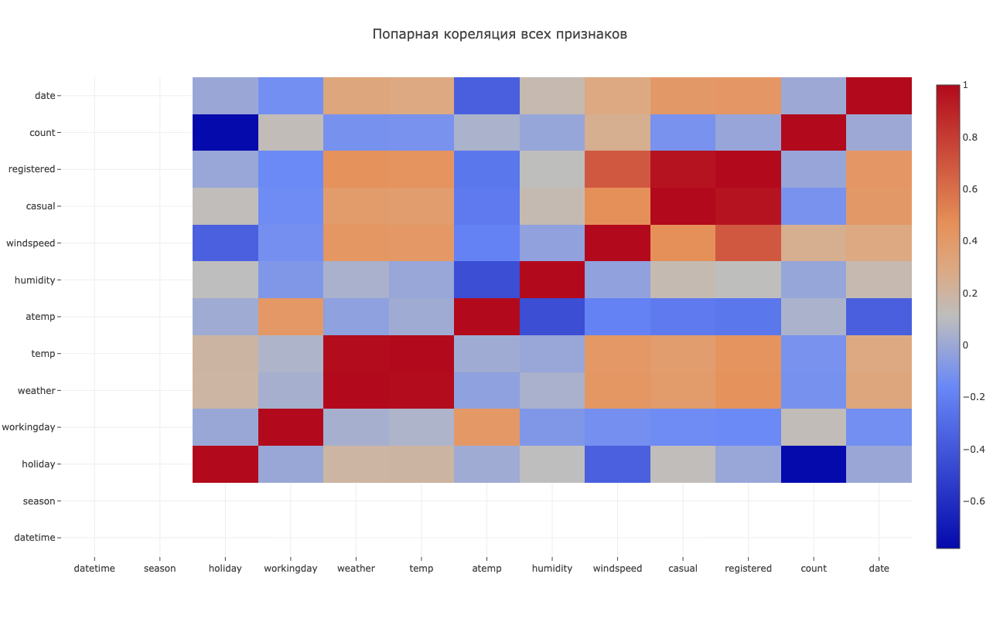

In [368]:
iplot(go.Figure(data = [go.Heatmap(z=bike_rent_data.corr(), \
                                   x = bike_rent_data.columns, \
                                   y=bike_rent_data.columns)], layout=dict(width=800, height=800, title='Попарная кореляция всех признаков')) ) 

In [60]:
seasonal_decompose = sm.tsa.seasonal_decompose(bike_rent_data['count'].values, freq=24)

In [59]:
def display_seasonal_decompose(seasonal_decompose, title='без заголовка'):
    '''
    Отображение результата простейшего разложения на тренд и сезонность через 
    '''
    fig_seasonal_decompose = tools.make_subplots(rows=4, cols=1, shared_xaxes=True, shared_yaxes=True, subplot_titles=('Оригинальный ряд','Тренд','Сезон','Остатки'))
    fig_seasonal_decompose['layout'].update(height=800, title=title);
    fig_seasonal_decompose.layout
    fig_seasonal_decompose.append_trace(go.Scatter(y=seasonal_decompose.observed, x=bike_rent_data['datetime'], mode='markers+lines'), 1,1)
    fig_seasonal_decompose.append_trace(go.Scatter(y=seasonal_decompose.trend, x=bike_rent_data['datetime']), 2,1)
    fig_seasonal_decompose.append_trace(go.Scatter(y=seasonal_decompose.seasonal, x=bike_rent_data['datetime'], mode='markers+lines'), 3,1)
    fig_seasonal_decompose.append_trace(go.Scatter(y=seasonal_decompose.resid, x=bike_rent_data['datetime'], mode='markers+lines'), 4,1)
    iplot(fig_seasonal_decompose)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]
[ (4,1) x1,y4 ]



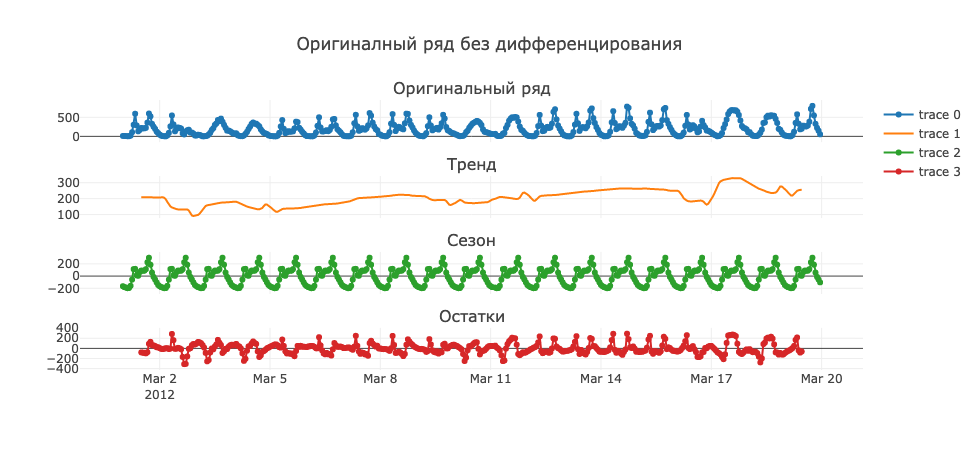

In [62]:
display_seasonal_decompose(seasonal_decompose, 'Оригиналный ряд без дифференцирования')

### Проверим значение критерия Дики-Фулера 

In [96]:
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(bike_rent_data['count'].values)[1])

Критерий Дики-Фуллера: p=0.000001


### Выполним сезонное дифференцирование
Длина сезона = 24

In [86]:
# drop target after differentiating
# bike_rent_data.drop([item for item in bike_rent_data.columns if 'count1' in item], axis=1, inplace=True)

In [87]:
season_lag=24

In [88]:
bike_rent_data['count24'] = bike_rent_data['count'] - bike_rent_data['count'].shift(season_lag)

In [92]:
print("Критерий Дики-Фуллера после сезонного (%s) дифференцирования: p=%f"\
      % (season_lag, sm.tsa.stattools.adfuller(bike_rent_data['count24'].values[season_lag:])[1]))

Критерий Дики-Фуллера после сезонного (24) дифференцирования: p=0.000016


In [93]:
seasonal_decompose = sm.tsa.seasonal_decompose(bike_rent_data['count24'].values[season_lag:], freq=24)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]
[ (4,1) x1,y4 ]



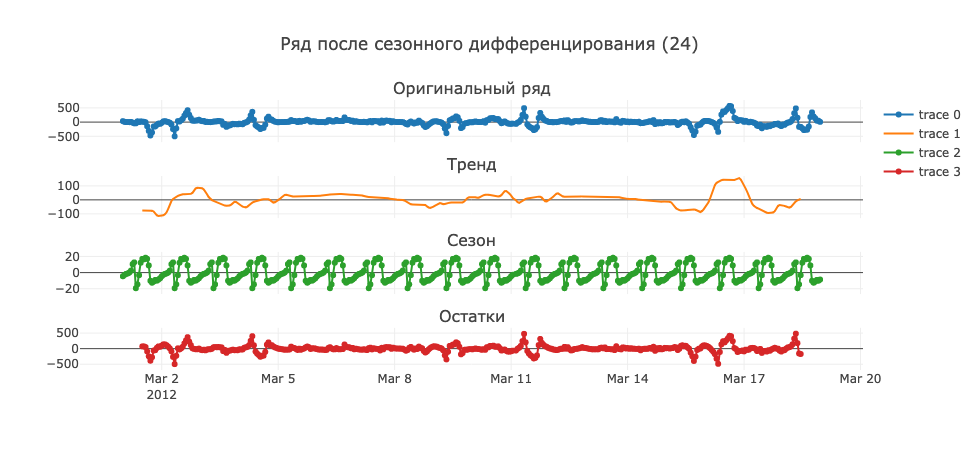

In [94]:
display_seasonal_decompose(seasonal_decompose, 'Ряд после сезонного дифференцирования (%s)'%season_lag)

 Мы видим, что ушел тренд, но сезонность осталась.  
 Сделаем еще и простое дифференцирование.


In [99]:
bike_rent_data['count241'] = bike_rent_data['count24'] - bike_rent_data['count24'].shift(1)

In [120]:
print("Критерий Дики-Фуллера после сезонного и простого диффенерцирования: p={:.20f}".format(sm.tsa.stattools.adfuller(bike_rent_data['count241'].values[season_lag+1:])[1]))

Критерий Дики-Фуллера после сезонного и простого диффенерцирования: p=0.00000000000000000000


In [101]:
seasonal_decompose = sm.tsa.seasonal_decompose(bike_rent_data['count241'].values[season_lag+1:], freq=24)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]
[ (4,1) x1,y4 ]



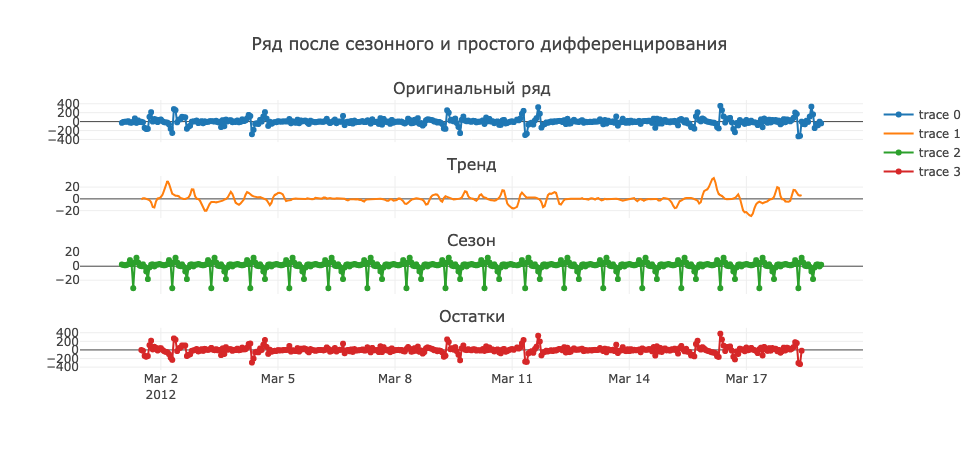

In [102]:
display_seasonal_decompose(seasonal_decompose, 'Ряд после сезонного и простого дифференцирования')

Попробуем двойное дифференцирование с длиной сезона в 12

In [105]:
season_lag_12 = 12

In [103]:
bike_rent_data['count12'] = bike_rent_data['count'] - bike_rent_data['count'].shift(season_lag_12)

In [104]:
bike_rent_data['count1212'] = bike_rent_data['count12'] - bike_rent_data['count12'].shift(season_lag_12)

In [121]:
df_criteria = sm.tsa.stattools.adfuller(bike_rent_data['count1212'].values[season_lag_12*2:])[1]
print("Критерий Дики-Фуллера после двойного сезонного диффенерцирования ({0:}): p={1:.20f}".format(season_lag_12 , df_criteria ))

Критерий Дики-Фуллера после двойного сезонного диффенерцирования (12): p=0.00000000069058324946


In [117]:
seasonal_decompose = sm.tsa.seasonal_decompose(bike_rent_data['count1212'].values[season_lag_12*2:], freq=12)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]
[ (4,1) x1,y4 ]



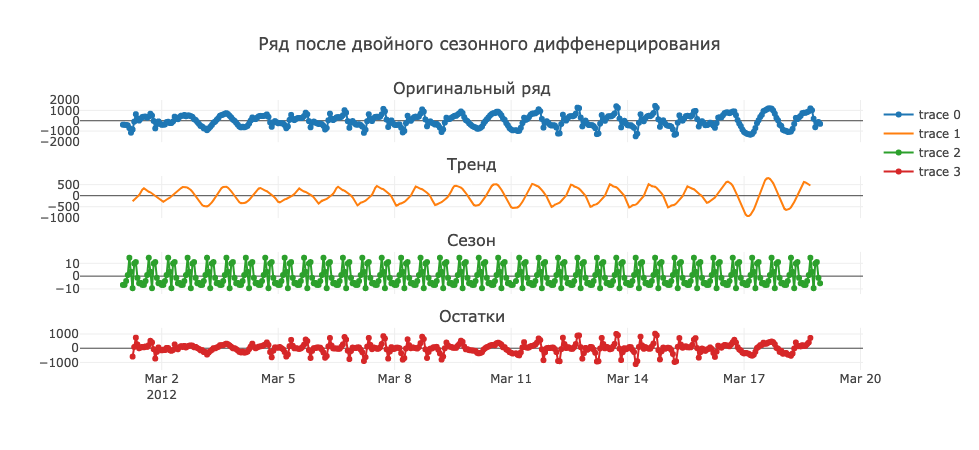

In [118]:
display_seasonal_decompose(seasonal_decompose, 'Ряд после двойного сезонного диффенерцирования')

Видим, что оптимальный результат достигается сезонным и простым дифференцированием.  
Приступим к перебору моделей и подбору параметров **p,d,q, P, D, Q**

In [123]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


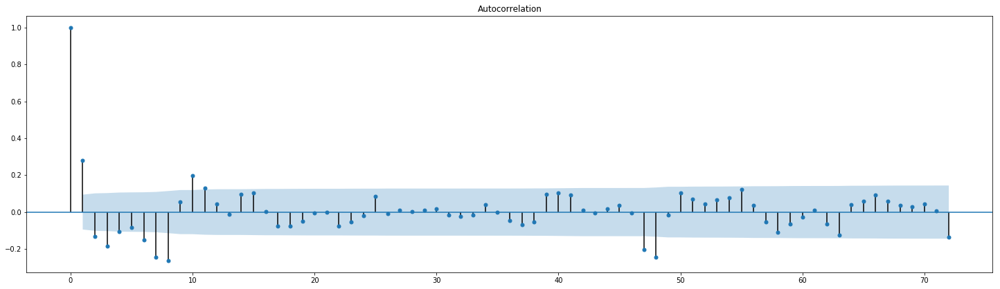

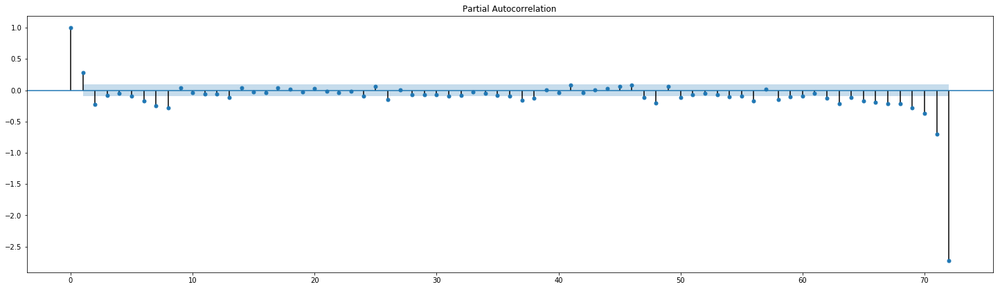

In [130]:
plt.figure(figsize(25,15))
ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(bike_rent_data['count241'][season_lag+1:].values, lags=72, ax=ax)
pylab.show()
ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(bike_rent_data['count241'][season_lag+1:].values, lags=72, ax=ax)
pylab.show()

In [175]:
ps = range(0, 10)
Ps = range(0, 4)

d, D = 1, 1

qs = range(0, 11)
Qs = range(0, 3)

In [176]:
from itertools import product
from tqdm import tqdm
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

1320

In [177]:
%%time
results = []
best_aic = float("inf")
warnings.filterwarnings('ignore')

for param in tqdm(parameters_list):
    #try except нужен, потому что на некоторых наборах параметров модель не обучается
    try:
        model=sm.tsa.statespace.SARIMAX(bike_rent_data['count'], order=(param[0], d, param[1]), 
                                        seasonal_order=(param[2], D, param[3], 24)).fit(disp=-1)
    #выводим параметры, на которых модель не обучается и переходим к следующему набору
    except ValueError:
        print('wrong parameters:', param)
        continue
    except Exception as ex:
        print(ex)
        continue
    aic = model.aic
    #сохраняем лучшую модель, aic, параметры
    if aic < best_aic:
        best_model = model
        best_aic = aic
        best_param = param
    results.append([param, model.aic])
    
warnings.filterwarnings('default')


  7%|▋         | 96/1320 [22:52<11:51:54, 34.90s/it]

wrong parameters: (0, 8, 0, 0)
wrong parameters: (0, 8, 0, 1)
wrong parameters: (0, 8, 0, 2)
wrong parameters: (0, 8, 1, 0)
wrong parameters: (0, 8, 1, 1)
wrong parameters: (0, 8, 1, 2)
wrong parameters: (0, 8, 2, 0)
wrong parameters: (0, 8, 2, 1)
wrong parameters: (0, 8, 2, 2)
wrong parameters: (0, 8, 3, 0)
wrong parameters: (0, 8, 3, 1)
wrong parameters: (0, 8, 3, 2)



 11%|█         | 144/1320 [35:02<4:25:07, 13.53s/it]

Singular matrix



 12%|█▏        | 156/1320 [37:11<7:05:29, 21.93s/it]

wrong parameters: (1, 2, 0, 0)
wrong parameters: (1, 2, 0, 1)
wrong parameters: (1, 2, 0, 2)
wrong parameters: (1, 2, 1, 0)
wrong parameters: (1, 2, 1, 1)
wrong parameters: (1, 2, 1, 2)
wrong parameters: (1, 2, 2, 0)
wrong parameters: (1, 2, 2, 1)
wrong parameters: (1, 2, 2, 2)
wrong parameters: (1, 2, 3, 0)
wrong parameters: (1, 2, 3, 1)
wrong parameters: (1, 2, 3, 2)
wrong parameters: (1, 3, 0, 0)
wrong parameters: (1, 3, 0, 1)
wrong parameters: (1, 3, 0, 2)
wrong parameters: (1, 3, 1, 0)
wrong parameters: (1, 3, 1, 1)
wrong parameters: (1, 3, 1, 2)
wrong parameters: (1, 3, 2, 0)
wrong parameters: (1, 3, 2, 1)
wrong parameters: (1, 3, 2, 2)
wrong parameters: (1, 3, 3, 0)
wrong parameters: (1, 3, 3, 1)
wrong parameters: (1, 3, 3, 2)



 16%|█▋        | 216/1320 [50:16<14:06:56, 46.03s/it]

Singular matrix



 17%|█▋        | 228/1320 [56:34<15:32:18, 51.23s/it]

wrong parameters: (1, 8, 0, 0)
wrong parameters: (1, 8, 0, 1)
wrong parameters: (1, 8, 0, 2)
wrong parameters: (1, 8, 1, 0)
wrong parameters: (1, 8, 1, 1)
wrong parameters: (1, 8, 1, 2)
wrong parameters: (1, 8, 2, 0)
wrong parameters: (1, 8, 2, 1)
wrong parameters: (1, 8, 2, 2)
wrong parameters: (1, 8, 3, 0)
wrong parameters: (1, 8, 3, 1)
wrong parameters: (1, 8, 3, 2)



 23%|██▎       | 300/1320 [1:17:44<6:04:40, 21.45s/it]

wrong parameters: (2, 3, 0, 0)
wrong parameters: (2, 3, 0, 1)
wrong parameters: (2, 3, 0, 2)
wrong parameters: (2, 3, 1, 0)
wrong parameters: (2, 3, 1, 1)
wrong parameters: (2, 3, 1, 2)
wrong parameters: (2, 3, 2, 0)
wrong parameters: (2, 3, 2, 1)
wrong parameters: (2, 3, 2, 2)
wrong parameters: (2, 3, 3, 0)
wrong parameters: (2, 3, 3, 1)
wrong parameters: (2, 3, 3, 2)



 27%|██▋       | 360/1320 [1:43:45<15:35:09, 58.45s/it]

wrong parameters: (2, 8, 0, 0)
wrong parameters: (2, 8, 0, 1)
wrong parameters: (2, 8, 0, 2)
wrong parameters: (2, 8, 1, 0)
wrong parameters: (2, 8, 1, 1)
wrong parameters: (2, 8, 1, 2)
wrong parameters: (2, 8, 2, 0)
wrong parameters: (2, 8, 2, 1)
wrong parameters: (2, 8, 2, 2)
wrong parameters: (2, 8, 3, 0)
wrong parameters: (2, 8, 3, 1)
wrong parameters: (2, 8, 3, 2)



 32%|███▏      | 420/1320 [2:07:09<7:19:28, 29.30s/it]

wrong parameters: (3, 2, 0, 0)
wrong parameters: (3, 2, 0, 1)
wrong parameters: (3, 2, 0, 2)
wrong parameters: (3, 2, 1, 0)
wrong parameters: (3, 2, 1, 1)
wrong parameters: (3, 2, 1, 2)
wrong parameters: (3, 2, 2, 0)
wrong parameters: (3, 2, 2, 1)
wrong parameters: (3, 2, 2, 2)
wrong parameters: (3, 2, 3, 0)
wrong parameters: (3, 2, 3, 1)
wrong parameters: (3, 2, 3, 2)
wrong parameters: (3, 3, 0, 0)
wrong parameters: (3, 3, 0, 1)
wrong parameters: (3, 3, 0, 2)
wrong parameters: (3, 3, 1, 0)
wrong parameters: (3, 3, 1, 1)
wrong parameters: (3, 3, 1, 2)
wrong parameters: (3, 3, 2, 0)
wrong parameters: (3, 3, 2, 1)
wrong parameters: (3, 3, 2, 2)
wrong parameters: (3, 3, 3, 0)
wrong parameters: (3, 3, 3, 1)
wrong parameters: (3, 3, 3, 2)



 42%|████▏     | 552/1320 [3:16:11<8:19:00, 38.99s/it]

wrong parameters: (4, 2, 0, 0)
wrong parameters: (4, 2, 0, 1)
wrong parameters: (4, 2, 0, 2)
wrong parameters: (4, 2, 1, 0)
wrong parameters: (4, 2, 1, 1)
wrong parameters: (4, 2, 1, 2)
wrong parameters: (4, 2, 2, 0)
wrong parameters: (4, 2, 2, 1)
wrong parameters: (4, 2, 2, 2)
wrong parameters: (4, 2, 3, 0)
wrong parameters: (4, 2, 3, 1)
wrong parameters: (4, 2, 3, 2)
wrong parameters: (4, 3, 0, 0)
wrong parameters: (4, 3, 0, 1)
wrong parameters: (4, 3, 0, 2)
wrong parameters: (4, 3, 1, 0)
wrong parameters: (4, 3, 1, 1)
wrong parameters: (4, 3, 1, 2)
wrong parameters: (4, 3, 2, 0)
wrong parameters: (4, 3, 2, 1)
wrong parameters: (4, 3, 2, 2)
wrong parameters: (4, 3, 3, 0)
wrong parameters: (4, 3, 3, 1)
wrong parameters: (4, 3, 3, 2)



 52%|█████▏    | 684/1320 [4:26:58<5:34:44, 31.58s/it]

wrong parameters: (5, 2, 0, 0)
wrong parameters: (5, 2, 0, 1)
wrong parameters: (5, 2, 0, 2)
wrong parameters: (5, 2, 1, 0)
wrong parameters: (5, 2, 1, 1)
wrong parameters: (5, 2, 1, 2)
wrong parameters: (5, 2, 2, 0)
wrong parameters: (5, 2, 2, 1)
wrong parameters: (5, 2, 2, 2)
wrong parameters: (5, 2, 3, 0)
wrong parameters: (5, 2, 3, 1)
wrong parameters: (5, 2, 3, 2)
wrong parameters: (5, 3, 0, 0)
wrong parameters: (5, 3, 0, 1)
wrong parameters: (5, 3, 0, 2)
wrong parameters: (5, 3, 1, 0)
wrong parameters: (5, 3, 1, 1)
wrong parameters: (5, 3, 1, 2)
wrong parameters: (5, 3, 2, 0)
wrong parameters: (5, 3, 2, 1)
wrong parameters: (5, 3, 2, 2)
wrong parameters: (5, 3, 3, 0)
wrong parameters: (5, 3, 3, 1)
wrong parameters: (5, 3, 3, 2)



 63%|██████▎   | 828/1320 [5:49:18<7:15:20, 53.09s/it]

Singular matrix
wrong parameters: (6, 3, 0, 0)
wrong parameters: (6, 3, 0, 1)
wrong parameters: (6, 3, 0, 2)
wrong parameters: (6, 3, 1, 0)
wrong parameters: (6, 3, 1, 1)
wrong parameters: (6, 3, 1, 2)
wrong parameters: (6, 3, 2, 0)
wrong parameters: (6, 3, 2, 1)
wrong parameters: (6, 3, 2, 2)
wrong parameters: (6, 3, 3, 0)
wrong parameters: (6, 3, 3, 1)
wrong parameters: (6, 3, 3, 2)



 73%|███████▎  | 960/1320 [7:13:44<4:54:33, 49.09s/it]

wrong parameters: (7, 3, 0, 0)
wrong parameters: (7, 3, 0, 1)
wrong parameters: (7, 3, 0, 2)
wrong parameters: (7, 3, 1, 0)
wrong parameters: (7, 3, 1, 1)
wrong parameters: (7, 3, 1, 2)
wrong parameters: (7, 3, 2, 0)
wrong parameters: (7, 3, 2, 1)
wrong parameters: (7, 3, 2, 2)
wrong parameters: (7, 3, 3, 0)
wrong parameters: (7, 3, 3, 1)
wrong parameters: (7, 3, 3, 2)



 95%|█████████▍| 1248/1320 [10:45:31<1:36:24, 80.34s/it]

wrong parameters: (9, 5, 0, 0)
wrong parameters: (9, 5, 0, 1)
wrong parameters: (9, 5, 0, 2)
wrong parameters: (9, 5, 1, 0)
wrong parameters: (9, 5, 1, 1)
wrong parameters: (9, 5, 1, 2)
wrong parameters: (9, 5, 2, 0)
wrong parameters: (9, 5, 2, 1)
wrong parameters: (9, 5, 2, 2)
wrong parameters: (9, 5, 3, 0)
wrong parameters: (9, 5, 3, 1)
wrong parameters: (9, 5, 3, 2)



 97%|█████████▋| 1284/1320 [11:08:52<56:21, 93.93s/it]

wrong parameters: (9, 8, 0, 0)
wrong parameters: (9, 8, 0, 1)
wrong parameters: (9, 8, 0, 2)
wrong parameters: (9, 8, 1, 0)
wrong parameters: (9, 8, 1, 1)
wrong parameters: (9, 8, 1, 2)
wrong parameters: (9, 8, 2, 0)
wrong parameters: (9, 8, 2, 1)
wrong parameters: (9, 8, 2, 2)
wrong parameters: (9, 8, 3, 0)
wrong parameters: (9, 8, 3, 1)
wrong parameters: (9, 8, 3, 2)



100%|██████████| 1320/1320 [11:36:37<00:00, 107.36s/it]

CPU times: user 1d 22h 12min 19s, sys: 8min 4s, total: 1d 22h 20min 24s
Wall time: 11h 36min 37s


In [178]:
result_table = pd.DataFrame(results)
result_table.columns = ['parameters', 'aic']
print(result_table.sort_values(by = 'aic', ascending=True).head())

         parameters          aic
116   (0, 10, 2, 2)  4776.694040
210   (1, 10, 2, 2)  4778.187672
318   (2, 10, 2, 2)  4780.740721
402    (3, 8, 2, 2)  4783.281257
1061   (9, 3, 2, 2)  4784.431108


In [141]:
result_table = pd.DataFrame(results)
result_table.columns = ['parameters', 'aic']
print(result_table.sort_values(by = 'aic', ascending=True).head())

        parameters          aic
116  (0, 10, 2, 2)  4776.694040
115  (0, 10, 2, 1)  4790.670471
118  (0, 10, 3, 1)  4791.774039
104   (0, 9, 2, 2)  4791.893370
110  (0, 10, 0, 2)  4792.332717


In [142]:
print(best_model.summary())

                                  Statespace Model Results                                 
Dep. Variable:                               count   No. Observations:                  455
Model:             SARIMAX(0, 1, 10)x(2, 1, 2, 24)   Log Likelihood               -2373.347
Date:                             Tue, 23 Apr 2019   AIC                           4776.694
Time:                                     17:34:09   BIC                           4837.651
Sample:                                          0   HQIC                          4800.764
                                             - 455                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.1053      1.356      0.078      0.938      -2.553       2.764
ma.L2         -0.3111      

Критерий Стьюдента: p=0.327856
Критерий Дики-Фуллера: p=0.000000


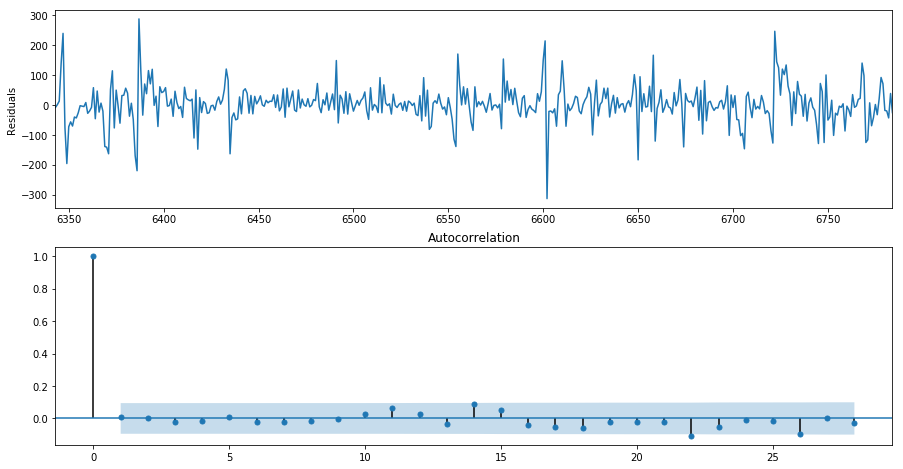

In [146]:
plt.figure(figsize(15,8))
plt.subplot(211)
best_model.resid[13:].plot()
plt.ylabel('Residuals')

ax = plt.subplot(212)
sm.graphics.tsa.plot_acf(best_model.resid[season_lag+1:].values.squeeze(), lags=28, ax=ax)

print("Критерий Стьюдента: p=%f" % stats.ttest_1samp(best_model.resid[season_lag+1:], 0)[1])
print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(best_model.resid[season_lag+1:])[1])

Остатки равны нулю (критерий Стьюдента), не стационарны (Дики-Фуллера) и не-автокореллированы.

In [206]:
xax_with_weekday = bike_rent_data['datetime'].apply( lambda x: x.strftime("%a \n %d %H"))
fig = go.Figure(data=[go.Scatter(x = xax_with_weekday, y=bike_rent_data['count'], name='Оригинал', mode='markers+lines'),\
                      go.Scatter(x = xax_with_weekday, y=best_model.fittedvalues, name='Предсказание', mode='markers+lines'),
                      go.Scatter(x = xax_with_weekday, y=best_model.resid, name='Остатки', mode='markers+lines') ],
                layout = timed_layout)

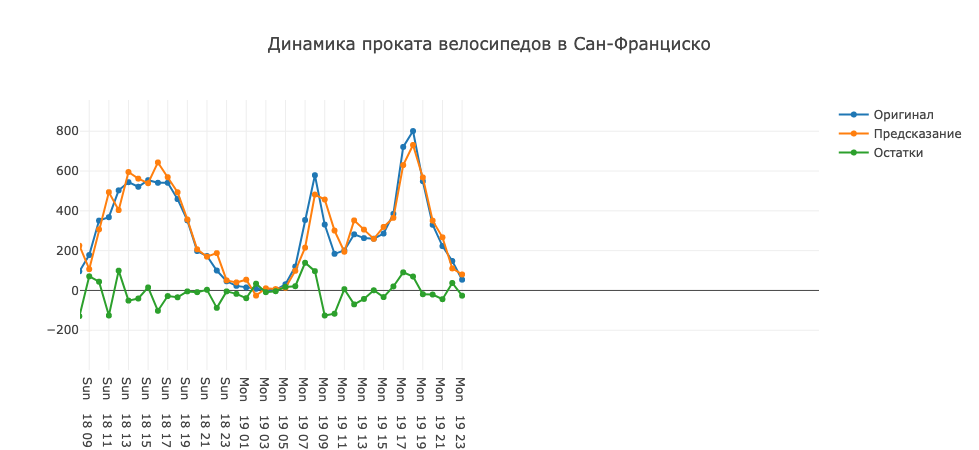

In [207]:
iplot(fig)

In [152]:
from sklearn.metrics import r2_score, mean_absolute_error

In [174]:
print("R2 = {:.2%} \nMAE = {:.1f}\nMean(count) = {:.1f} ".format(r2_score(bike_rent_data['count'][season_lag+1:],best_model.fittedvalues[season_lag+1:]),\
      mean_absolute_error(bike_rent_data['count'][season_lag+1:], best_model.fittedvalues[season_lag+1:]),\
      np.mean(bike_rent_data['count'])))

R2 = 89.42% 
MAE = 40.9
Mean(count) = 208.3 


## Сделаем прогноз

In [236]:
# создадим список из дат на неделю впреред после крайнего предсказания
predict_date_range = pd.date_range(start = bike_rent_data.iloc[-1:]['datetime'].values[0], periods = 24*7, freq='1H')[1:]

In [237]:
# делаем предсказание на неделю впреред
predicted_count = best_model.predict(start = bike_rent_data.index[-1]+1,\
                                     end = bike_rent_data.index[-1]+24*7+1)

In [252]:
xax_with_weekday = bike_rent_data['datetime'].apply( lambda x: x.strftime("%a \n %d %H"))
fig = go.Figure(data=[go.Scatter(x = xax_with_weekday, y=bike_rent_data['count'], name='Оригинал', mode='markers+lines'),\
                      go.Scatter(x = list(map(lambda x: x.strftime("%a \n %d %H"), predict_date_range)), \
                                 y= [0 if item < 0 else item for item in predicted_count] , name='Предсказание', mode='markers+lines')],
                layout = timed_layout)

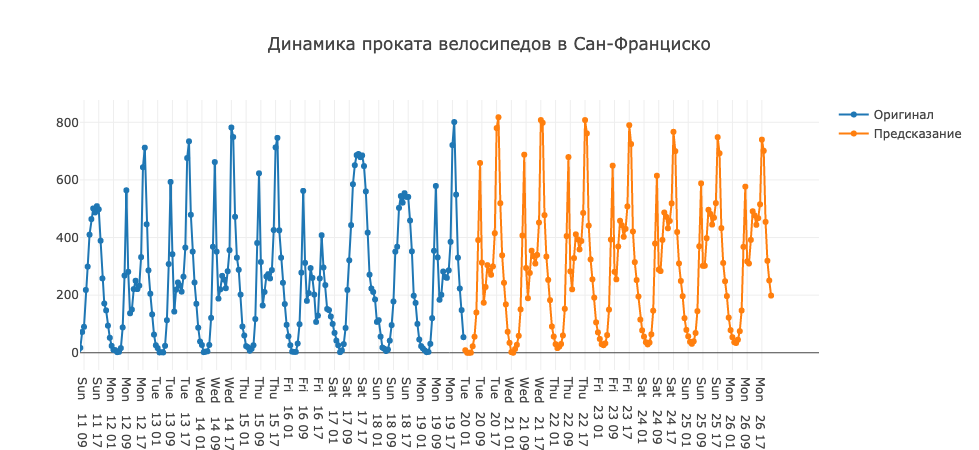

In [253]:
iplot(fig)

## Анализ предсказания
Модель не может уловить разницу между выходным и обычным днем - ее сезонность - 24 часа.  
Посмотрим, как можно улучшить нашу модель.

## Сделаем простую линейную регрессию

In [254]:
import scipy as sc
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from statsmodels.graphics.regressionplots import plot_leverage_resid2

In [275]:
bike_rent_data.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,date,weekday,hour
0,2012-03-01 00:00:00,1,0,1,2,17.22,21.210,94,0.0000,1,10,11,2012-03-01,3,0
1,2012-03-01 01:00:00,1,0,1,3,18.86,22.725,94,7.0015,0,12,12,2012-03-01,3,1
2,2012-03-01 02:00:00,1,0,1,2,18.86,22.725,94,19.0012,0,6,6,2012-03-01,3,2
3,2012-03-01 03:00:00,1,0,1,1,18.86,22.725,94,15.0013,0,3,3,2012-03-01,3,3
4,2012-03-01 04:00:00,1,0,1,1,19.68,23.485,88,12.9980,0,5,5,2012-03-01,3,4


In [269]:
day_of_week = lambda x: x.weekday()
bike_rent_data['weekday'] = bike_rent_data['datetime'].apply(day_of_week)

In [274]:
bike_rent_data['hour'] = bike_rent_data['datetime'].apply(lambda x: x.hour)

### Переведем данные о дне недели и часе в отдельные признаки через OneHotEncoder

In [297]:
from sklearn.preprocessing import OneHotEncoder
onehotencoder = OneHotEncoder(sparse=False, categories='auto', dtype=int)

In [298]:
weekday_hour_encoded = onehotencoder.fit_transform(bike_rent_data[['weekday', 'hour']])

In [299]:
weekday_hour_encoded.shape

(455, 31)

In [300]:
weekday_columns = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

In [301]:
hour_columns = ['hour_'+str(item) for item in range(0, 24)]

In [305]:
bike_rent_data_extended = pd.concat([bike_rent_data, pd.DataFrame(weekday_hour_encoded, columns=weekday_columns + hour_columns)], axis=1)

In [307]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', 100)

In [308]:
bike_rent_data_extended.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,date,weekday,hour,Mon,Tue,Wed,Thu,Fri,Sat,Sun,hour_0,hour_1,hour_2,hour_3,hour_4,hour_5,hour_6,hour_7,hour_8,hour_9,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
0,2012-03-01 00:00:00,1,0,1,2,17.22,21.210,94,0.0000,1,10,11,2012-03-01,3,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2012-03-01 01:00:00,1,0,1,3,18.86,22.725,94,7.0015,0,12,12,2012-03-01,3,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2012-03-01 02:00:00,1,0,1,2,18.86,22.725,94,19.0012,0,6,6,2012-03-01,3,2,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2012-03-01 03:00:00,1,0,1,1,18.86,22.725,94,15.0013,0,3,3,2012-03-01,3,3,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2012-03-01 04:00:00,1,0,1,1,19.68,23.485,88,12.9980,0,5,5,2012-03-01,3,4,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [311]:
onehotencoder_weather = OneHotEncoder(sparse=False, categories='auto', dtype=int)

In [313]:
weather_encoded = onehotencoder_weather.fit_transform(bike_rent_data[['weather']])

In [314]:
weather_encoded.shape

(455, 3)

In [315]:
weather_columns = ['weather_1', 'weather_2', 'weather_3']

In [316]:
bike_rent_data_extended = pd.concat([bike_rent_data_extended, pd.DataFrame(weather_encoded, columns = weather_columns)], axis=1)

In [317]:
bike_rent_data_extended.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,date,weekday,hour,Mon,Tue,Wed,Thu,Fri,Sat,Sun,hour_0,hour_1,hour_2,hour_3,hour_4,hour_5,hour_6,hour_7,hour_8,hour_9,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,weather_1,weather_2,weather_3
0,2012-03-01 00:00:00,1,0,1,2,17.22,21.210,94,0.0000,1,10,11,2012-03-01,3,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,2012-03-01 01:00:00,1,0,1,3,18.86,22.725,94,7.0015,0,12,12,2012-03-01,3,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,2012-03-01 02:00:00,1,0,1,2,18.86,22.725,94,19.0012,0,6,6,2012-03-01,3,2,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,2012-03-01 03:00:00,1,0,1,1,18.86,22.725,94,15.0013,0,3,3,2012-03-01,3,3,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,2012-03-01 04:00:00,1,0,1,1,19.68,23.485,88,12.9980,0,5,5,2012-03-01,3,4,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [413]:
misc_columns = ['holiday', 'temp', 'atemp', 'humidity', 'windspeed']

In [354]:
ols_columns = misc_columns + weather_columns + weekday_columns + hour_columns

In [409]:
# подготовим данные для OLS
linreg_columns = 'count ~ ' + "+".join(ols_columns)
print(linreg_columns+'\n\n')
# строим модель
bike_ols_model = smf.ols(linreg_columns, data = bike_rent_data_extended)
fitted_bike_ols_model = bike_ols_model.fit(cov_type='HC1')
print (fitted_bike_ols_model.summary())

count ~ holiday+temp+atemp+humidity+windspeed+weather_1+weather_2+weather_3+Mon+Tue+Wed+Thu+Fri+Sat+Sun+hour_0+hour_1+hour_2+hour_3+hour_4+hour_5+hour_6+hour_7+hour_8+hour_9+hour_10+hour_11+hour_12+hour_13+hour_14+hour_15+hour_16+hour_17+hour_18+hour_19+hour_20+hour_21+hour_22+hour_23


                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.742
Model:                            OLS   Adj. R-squared:                  0.720
Method:                 Least Squares   F-statistic:                     112.2
Date:                Mon, 29 Apr 2019   Prob (F-statistic):          2.25e-191
Time:                        20:28:21   Log-Likelihood:                -2713.3
No. Observations:                 455   AIC:                             5499.
Df Residuals:                     419   BIC:                             5647.
Df Model:                          35                                         
C

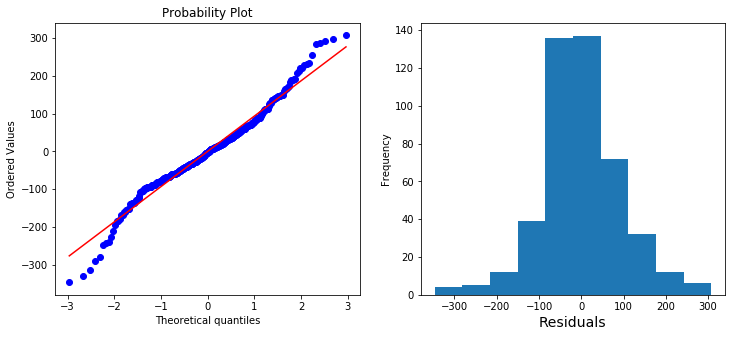

In [343]:
plt.figure(figsize=(12,5))
plt.subplot(121)
sc.stats.probplot(fitted_bike_ols_model.resid, dist="norm", plot=plt)
plt.subplot(122)
fitted_bike_ols_model.resid.plot.hist(10)
plt.xlabel('Residuals', fontsize=14)
plt.show()

проверим остатки на нормальность по критерию Шапиро-Вилко

In [351]:
from scipy.stats import shapiro
stat, p = shapiro(fitted_bike_ols_model.resid)
print("The null hypothesis that the \ndata was drawn from a normal distribution \nstat={:.5f}  pval={:.5f}".format(stat, p))

The null hypothesis that the 
data was drawn from a normal distribution 
stat=0.97485  pval=0.00000


в остатках есть информация - поработаем еще над моделью - пару-тройку процентов точности еще можно улучшить

## Выделим кореллирующие признаки

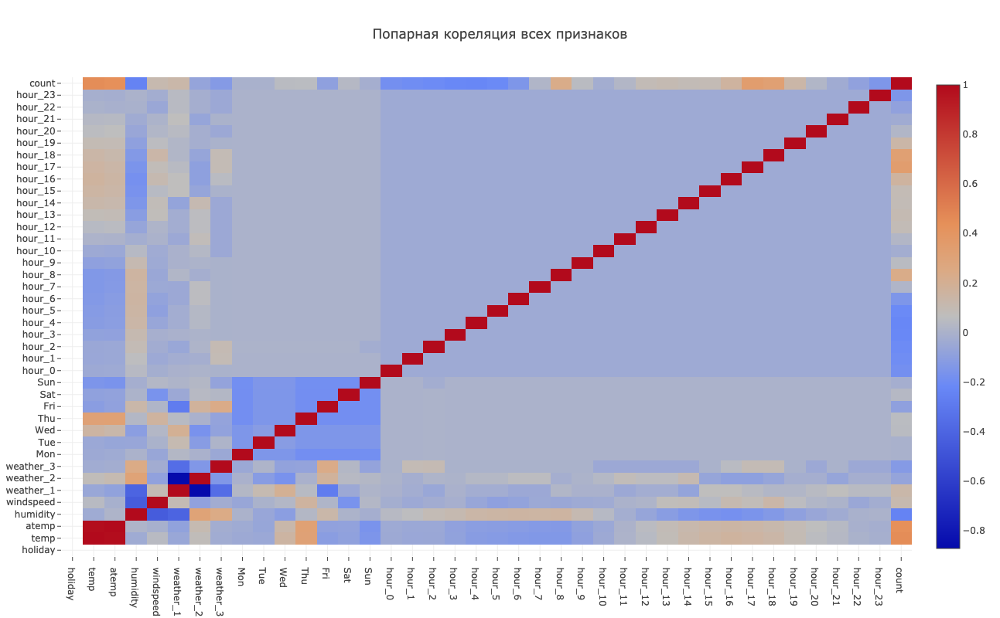

In [371]:
iplot(go.Figure(data = [go.Heatmap(z = bike_rent_data_extended[ols_columns + ['count']].corr(), \
                                   x = ols_columns + ['count'], \
                                   y=ols_columns + ['count']) ], layout=dict(width=800, height=800, title='Попарная кореляция всех признаков')) )

смело можно выкинуть `atemp`

## Построим зависимость остатков от всех признаков модели

In [406]:
def display_residuals(resid, exog_columns, exog_data, title='без заголовка'):
    '''
    Отображение зависимости остатков от экзогенных переменных через plotly
    resid - остатки
    exog_columns - список с экзогенными колонками
    exog_data - датафрейм с данными экзогенных переменных
    title - заглавие для всей визуализации
    '''
    fig_resid = tools.make_subplots(rows=len(exog_columns), cols=1, shared_yaxes=True,\
                                    subplot_titles=exog_columns, print_grid=False)
    fig_resid['layout'].update(height=350*len(exog_columns), width=800, title=title);
    for num, item in enumerate(exog_columns):
        fig_resid.add_trace(go.Scatter(y=resid, x = exog_data[item], mode = 'markers'), num+1,1)

    iplot(fig_resid)

['temp', 'windspeed', 'humidity']


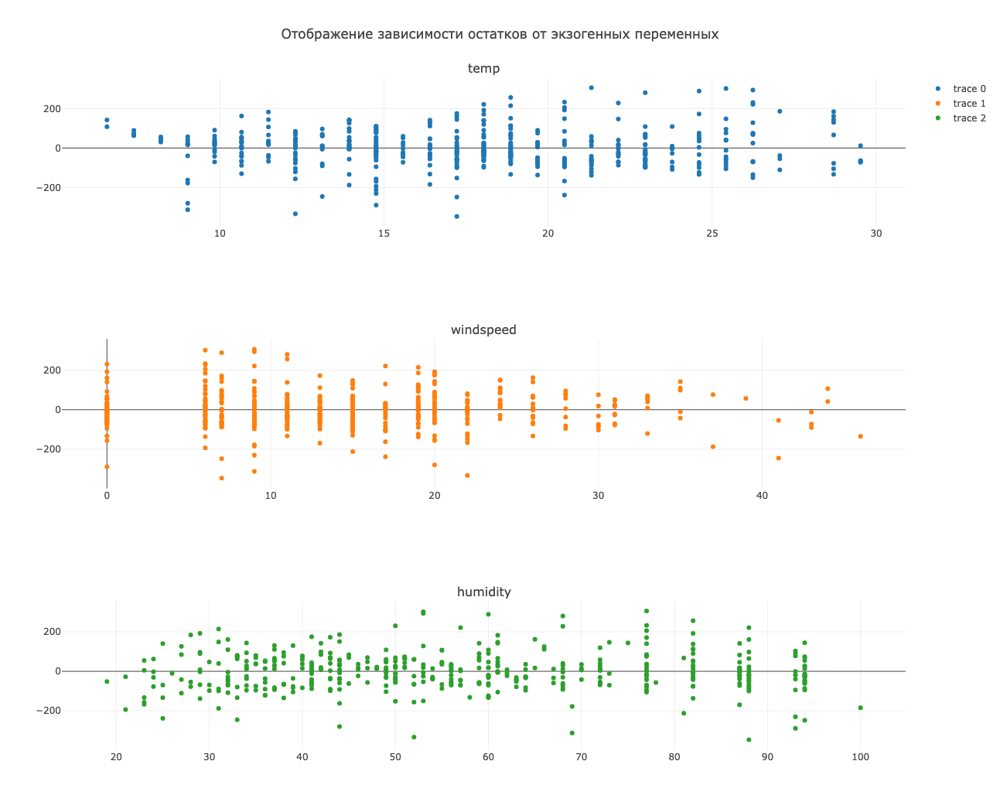

In [405]:
display_residuals(fitted_bike_ols_model.resid, ['temp', 'windspeed', 'humidity'], bike_rent_data_extended,\
                  title='Отображение зависимости остатков от экзогенных переменных' )

На первый взгляд не видно 

## Посмотрим на влияние объектов на обучение модели

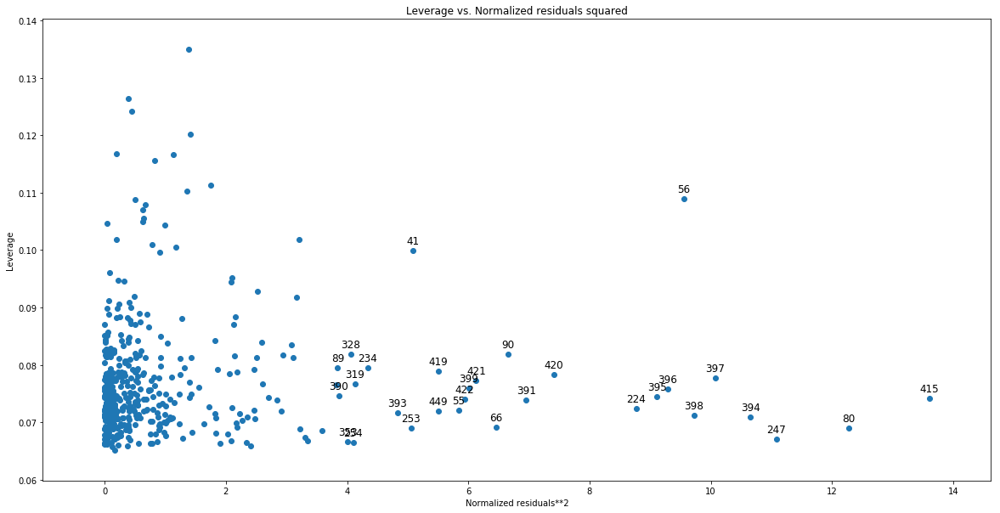

In [344]:
fig, ax = plt.subplots(figsize = (20,10))
plot_leverage_resid2(fitted_bike_ols_model, ax = ax)
plt.show()

## Прологарифмируем отклик и построим вариации признаков

In [ ]:
# уберем сильно-кореллированный признак atemp
from copy import copy
ols_columns1 = copy(ols_columns)
ols_columns1.remove('atemp')

In [423]:
# подготовим данные для OLS
linreg_columns1 = 'np.log(count) ~ ' + '+'.join(ols_columns1)
print(linreg_columns1+'\n\n')
# строим модель
bike_ols_model = smf.ols(linreg_columns1, data = bike_rent_data_extended)
fitted_bike_ols_model1 = bike_ols_model.fit(cov_type='HC1')
print (fitted_bike_ols_model1.summary())

np.log(count) ~ holiday+temp+humidity+windspeed+weather_1+weather_2+weather_3+Mon+Tue+Wed+Thu+Fri+Sat+Sun+hour_0+hour_1+hour_2+hour_3+hour_4+hour_5+hour_6+hour_7+hour_8+hour_9+hour_10+hour_11+hour_12+hour_13+hour_14+hour_15+hour_16+hour_17+hour_18+hour_19+hour_20+hour_21+hour_22+hour_23


                            OLS Regression Results                            
Dep. Variable:          np.log(count)   R-squared:                       0.833
Model:                            OLS   Adj. R-squared:                  0.819
Method:                 Least Squares   F-statistic:                     2669.
Date:                Tue, 30 Apr 2019   Prob (F-statistic):               0.00
Time:                        19:26:02   Log-Likelihood:                -441.66
No. Observations:                 455   AIC:                             953.3
Df Residuals:                     420   BIC:                             1098.
Df Model:                          34                                         

/Users/sergei/anaconda/envs/python3/lib/python3.6/site-packages/statsmodels/base/model.py:1532: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 38, but rank is 35



точность модели значительно улучшилась `(на 9%!)` и сократилось число признаков, для которых коэффициенты линейной регрессии равны нулю

## Проверим остатки

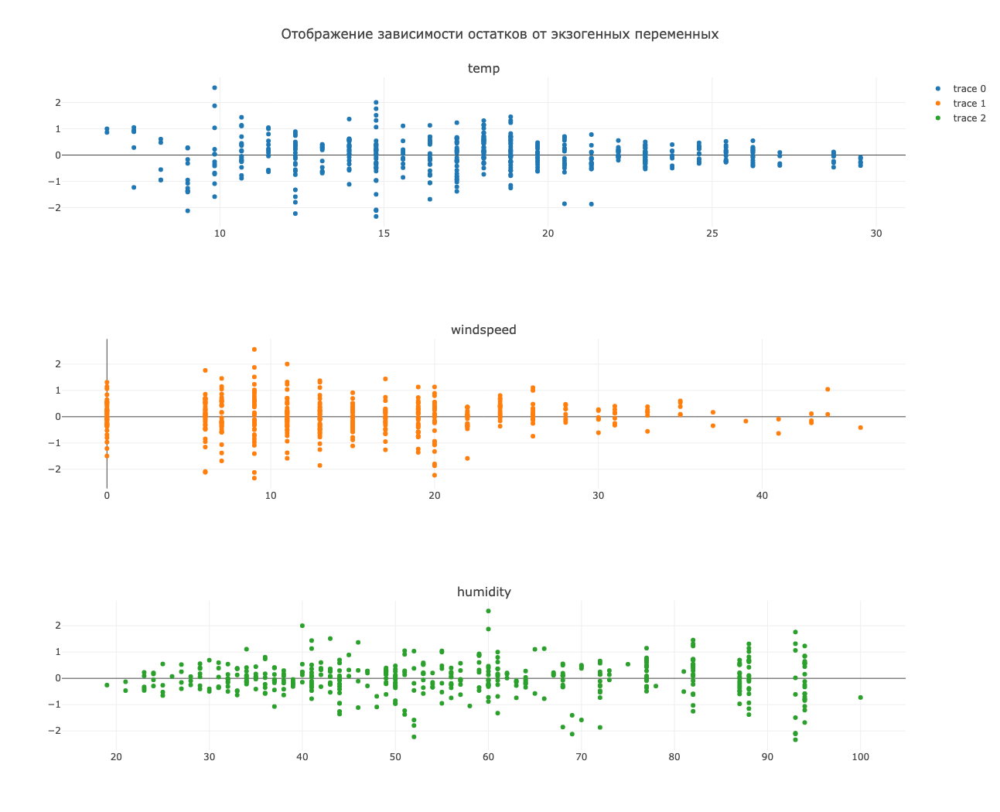

In [424]:
display_residuals(fitted_bike_ols_model1.resid, ['temp', 'windspeed', 'humidity'], bike_rent_data_extended,\
                  title='Отображение зависимости остатков от экзогенных переменных' )

## Тест на нормальность остатков

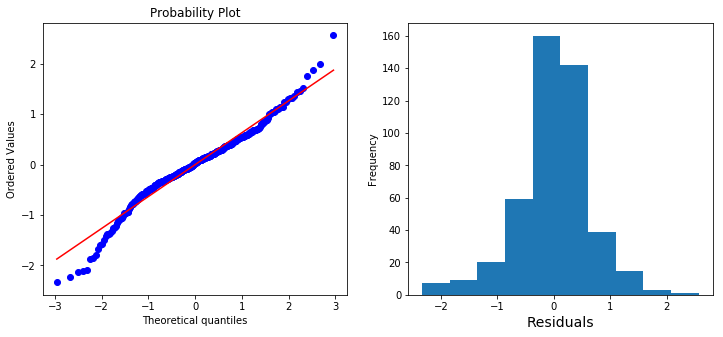

In [426]:
plt.figure(figsize=(12,5))
plt.subplot(121)
sc.stats.probplot(fitted_bike_ols_model1.resid, dist="norm", plot=plt)
plt.subplot(122)
fitted_bike_ols_model1.resid.plot.hist(10)
plt.xlabel('Residuals', fontsize=14)
plt.show()

In [427]:
stat, p = shapiro(fitted_bike_ols_model1.resid)
print("The null hypothesis that the \ndata was drawn from a normal distribution \nstat={:.5f}  pval={:.5f}".format(stat, p))

The null hypothesis that the 
data was drawn from a normal distribution 
stat=0.97013  pval=0.00000


По прежнему остатки не нормальны...

##  Удилим незначимые признаки
holiday, humidity, windspeed

In [430]:
ols_columns2 = copy(ols_columns1)
ols_columns2.remove('holiday')
ols_columns2.remove('humidity')
ols_columns2.remove('windspeed')

In [431]:
# подготовим данные для OLS
linreg_columns2 = 'np.log(count) ~ ' + '+'.join(ols_columns2)
print(linreg_columns2+'\n\n')
# строим модель
bike_ols_model = smf.ols(linreg_columns2, data = bike_rent_data_extended)
fitted_bike_ols_model2 = bike_ols_model.fit(cov_type='HC1')
print (fitted_bike_ols_model2.summary())

np.log(count) ~ temp+weather_1+weather_2+weather_3+Mon+Tue+Wed+Thu+Fri+Sat+Sun+hour_0+hour_1+hour_2+hour_3+hour_4+hour_5+hour_6+hour_7+hour_8+hour_9+hour_10+hour_11+hour_12+hour_13+hour_14+hour_15+hour_16+hour_17+hour_18+hour_19+hour_20+hour_21+hour_22+hour_23


                            OLS Regression Results                            
Dep. Variable:          np.log(count)   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.819
Method:                 Least Squares   F-statistic:                     2839.
Date:                Tue, 30 Apr 2019   Prob (F-statistic):               0.00
Time:                        19:39:27   Log-Likelihood:                -442.84
No. Observations:                 455   AIC:                             951.7
Df Residuals:                     422   BIC:                             1088.
Df Model:                          32                                         
Covariance Type:          

/Users/sergei/anaconda/envs/python3/lib/python3.6/site-packages/statsmodels/base/model.py:1532: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 35, but rank is 33



Модель стала проще и качество не ухудшилось.

##  Построим Рег-АРМУ - модель ARIMA поверх нашей линейной регрессии

Вспомним, что наша лучшая модель p = 0, q = 10 , P = 2, Q = 2  
Вовсе не факт, что в рег-арме будут такие же параметры, НО  
чтобы не перебирать в более сложной модели 1320 вариантов, 
для начала запустим самый короткий тест - **регарму (p=0, q=10, P=2, Q=2)**

In [438]:
reg_arma_model = sm.tsa.statespace.SARIMAX(bike_rent_data_extended['count'], 
                                          exog = bike_rent_data_extended[exog_features].as_matrix(), 
                                          order = (0, d, 10),
                                          seasonal_order = (2, D, 2, 24), 
                                          measurement_error=False).fit(disp=-1)

In [442]:
print(reg_arma_model.summary())

                                  Statespace Model Results                                 
Dep. Variable:                               count   No. Observations:                  455
Model:             SARIMAX(0, 1, 10)x(2, 1, 2, 24)   Log Likelihood               -2352.840
Date:                             Tue, 30 Apr 2019   AIC                           4805.680
Time:                                     20:03:47   BIC                           5008.869
Sample:                                          0   HQIC                          4885.913
                                             - 455                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             5.9808      2.563      2.333      0.020       0.957      11.005
x2             0.6052   3.7

In [444]:
print("R2 = {:.2%} \nMAE = {:.1f}\nMean(count) = {:.1f} ".format(r2_score(bike_rent_data['count'][season_lag+1:], reg_arma_model.fittedvalues[season_lag+1:]),\
      mean_absolute_error(bike_rent_data['count'][season_lag+1:], reg_arma_model.fittedvalues[season_lag+1:]),\
      np.mean(bike_rent_data['count'])))

R2 = 90.38% 
MAE = 40.0
Mean(count) = 208.3 


#### Качество повысилось, а теперь давайте проведем визуальный анализ через прогноз данных на неделю вперед.
для этого сделаем оложенную выборку длиной в 1 неделю с конца нашего датасета

In [451]:
bike_rent_data_train = bike_rent_data_extended.iloc[:-24*7]
bike_rent_data_test = bike_rent_data_extended.iloc[-24*7:]

In [457]:
bike_rent_data_train.tail(1)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,date,weekday,hour,Mon,Tue,Wed,Thu,Fri,Sat,Sun,hour_0,hour_1,hour_2,hour_3,hour_4,hour_5,hour_6,hour_7,hour_8,hour_9,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,weather_1,weather_2,weather_3
286,2012-03-12 23:00:00,1,0,1,1,22.96,26.515,56,15.0013,10,53,63,2012-03-12,0,23,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0


In [458]:
bike_rent_data_test.head(1)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,date,weekday,hour,Mon,Tue,Wed,Thu,Fri,Sat,Sun,hour_0,hour_1,hour_2,hour_3,hour_4,hour_5,hour_6,hour_7,hour_8,hour_9,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,weather_1,weather_2,weather_3
287,2012-03-13,1,0,1,2,22.96,26.515,52,12.998,5,21,26,2012-03-13,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [459]:
reg_arma_model1 = sm.tsa.statespace.SARIMAX(bike_rent_data_train['count'], 
                                          exog = bike_rent_data_train[exog_features].as_matrix(), 
                                          order = (0, d, 10),
                                          seasonal_order = (2, D, 2, 24), 
                                          measurement_error=False).fit(disp=-1)

In [461]:
# делаем предсказание на неделю впреред
predict_regarma = reg_arma_model1.predict(start = bike_rent_data_test.index[0],\
                                          end = bike_rent_data_test.index[-1], \
                                          dynamic = False,\
                                          exog = bike_rent_data_test[exog_features].as_matrix())

In [465]:
xax_with_weekday = bike_rent_data_test['datetime'].apply( lambda x: x.strftime("%a \n %d %H"))
fig = go.Figure(data=[go.Scatter(x = xax_with_weekday, y = bike_rent_data_test['count'], name='Оригинал', mode='markers+lines'),\
                      go.Scatter(x = xax_with_weekday, y = predict_regarma, name='Предсказание regarma', mode='markers+lines'),\
                      go.Scatter(x = xax_with_weekday, y = best_model.fittedvalues[bike_rent_data_test.index[0]: bike_rent_data_test.index[-1]],\
                                name='Предсказание arima', mode='markers+lines')],
                layout = timed_layout)

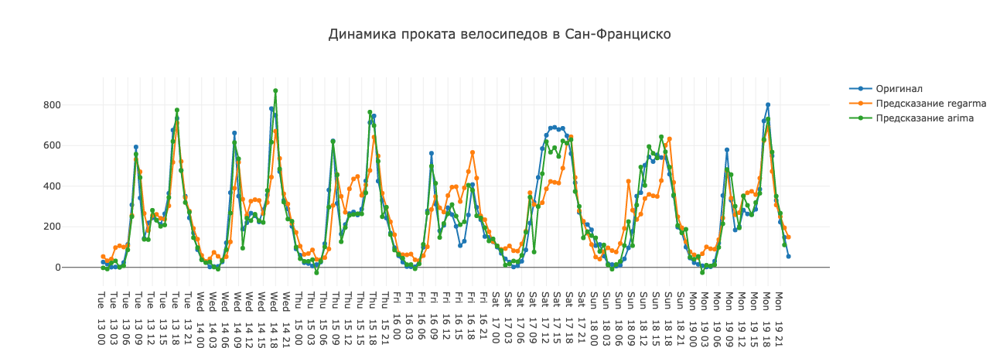

In [466]:
iplot(fig)

Визуально лучше не стало  
Выполним полный цикл перебора для поиска лучшей модели рег-арма - для этого нам потребуется больше вычислительных ресурсов.  
За этим обратимся на kaggle - создадим датасет и создадим ядно обработки этого датасета в облаке.

In [506]:
def display_quality_metrics(y_true, y_pred):
    print("R2 = {:.2%} \nMAE = {:.1f}\nMean(count) = {:.1f} ".format(r2_score(y_true, y_pred),\
      mean_absolute_error(y_true, y_pred),\
      np.mean(y_true)))

In [508]:
display_quality_metrics(bike_rent_data_test['count'].values, predict_regarma)

R2 = 69.83% 
MAE = 89.8
Mean(count) = 253.6 


##  Сравним метрики качества на тестовой выборке с линейной моделью

In [525]:
linreg_columns2 = 'np.log(count) ~ ' + '+'.join(ols_columns2)
# строим модель
bike_ols_model = smf.ols(linreg_columns2, data = bike_rent_data_train)
fitted_bike_ols_model3 = bike_ols_model.fit(cov_type='HC1')
#print (fitted_bike_ols_model3.summary())
ols_predict = fitted_bike_ols_model3.predict(bike_rent_data_test[ols_columns2])
ols_predict  = np.exp(ols_predict)
display_quality_metrics(bike_rent_data_test['count'].values, ols_predict)

R2 = 72.55% 
MAE = 77.4
Mean(count) = 253.6 


---
линейная модель показывает лучшее качество, но так же не может отделить выходные дни от обычных (см. визуализацию ниже)

---

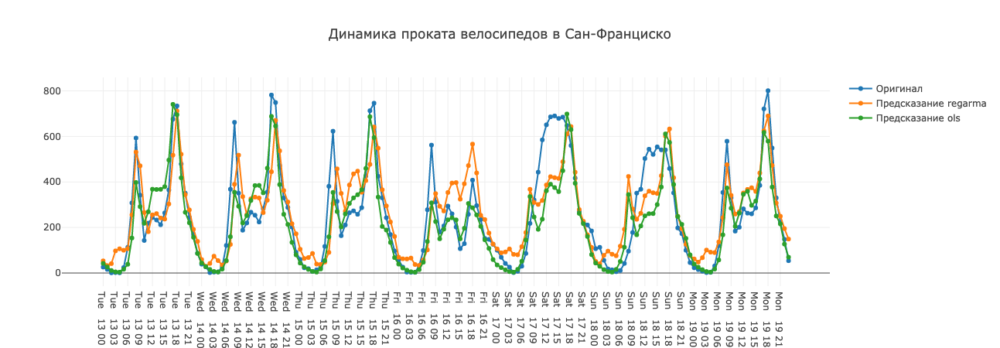

In [526]:
xax_with_weekday = bike_rent_data_test['datetime'].apply( lambda x: x.strftime("%a \n %d %H"))
fig = go.Figure(data=[go.Scatter(x = xax_with_weekday, y = bike_rent_data_test['count'], name='Оригинал', mode='markers+lines'),\
                      go.Scatter(x = xax_with_weekday, y = predict_regarma, name='Предсказание regarma', mode='markers+lines'),\
                      go.Scatter(x = xax_with_weekday, y = ols_predict,\
                                name='Предсказание ols', mode='markers+lines')],
                layout = timed_layout)
iplot(fig)

In [470]:
bike_rent_data_train.to_csv('bike_rent_data_train.csv', sep = '\t', index = False)

In [472]:
!ls -lh bike_rent_data_train*

-rw-r--r--  1 sergei  staff    43K  3 май 15:08 bike_rent_data_train.csv


## Попроубем проверить **рег-ариму** на логарифмированном отклике

In [482]:
bike_rent_data_extended['count_lg'] = np.log(bike_rent_data_extended['count'])

In [484]:
xax_with_weekday = bike_rent_data['datetime'].apply( lambda x: x.strftime("%a \n %d %H"))
fig = go.Figure(data=[go.Scatter(x = xax_with_weekday, y=bike_rent_data_extended['count_lg'], name='Логарифмированный отклик', mode='markers+lines')],
                layout = timed_layout)

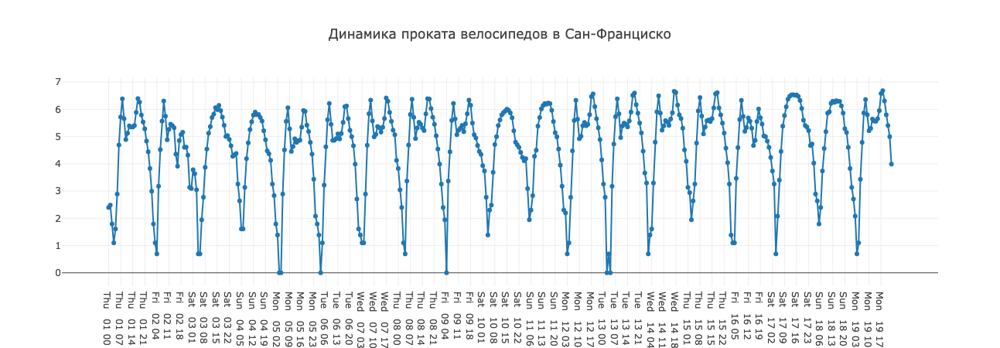

In [485]:
iplot(fig)

In [487]:
bike_rent_data_extended['count_lg24'] = bike_rent_data_extended['count_lg'] - bike_rent_data_extended['count_lg'].shift(24)
bike_rent_data_extended['count_lg241'] = bike_rent_data_extended['count_lg24'] - bike_rent_data_extended['count_lg24'].shift(1)

In [493]:
seasonal_decompose = sm.tsa.seasonal_decompose(bike_rent_data_extended['count_lg241'].values[season_lag*2+1:], freq=24)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]
[ (4,1) x1,y4 ]



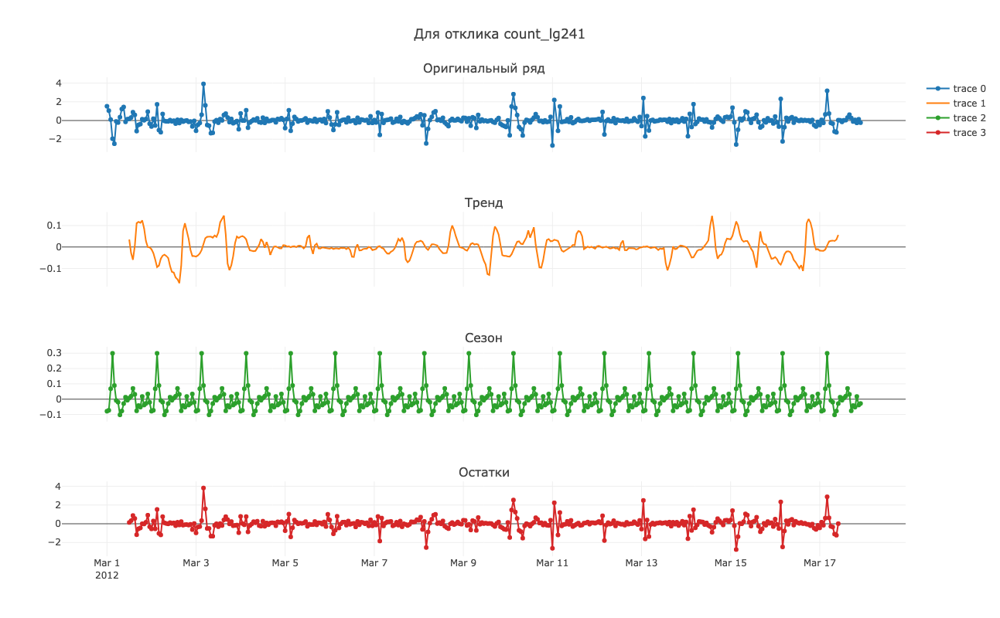

In [494]:
display_seasonal_decompose(seasonal_decompose, 'Для отклика count_lg241')

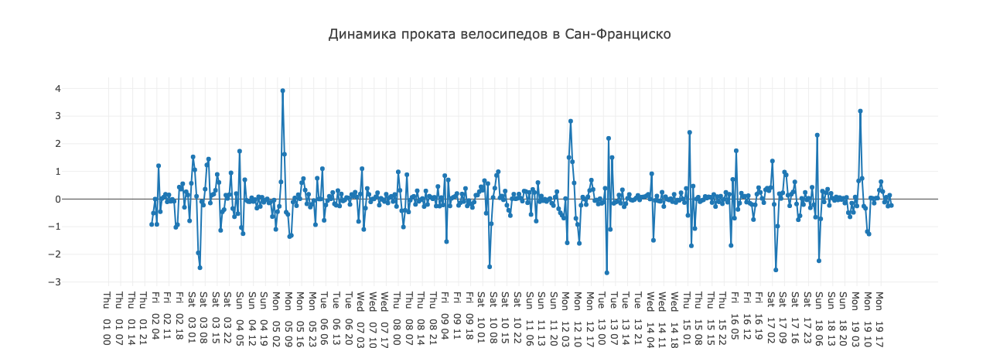

In [491]:
fig = go.Figure(data=[go.Scatter(x = xax_with_weekday, y=bike_rent_data_extended['count_lg241'], name='Логарифмированный отклик', mode='markers+lines')],
                layout = timed_layout)
iplot(fig)

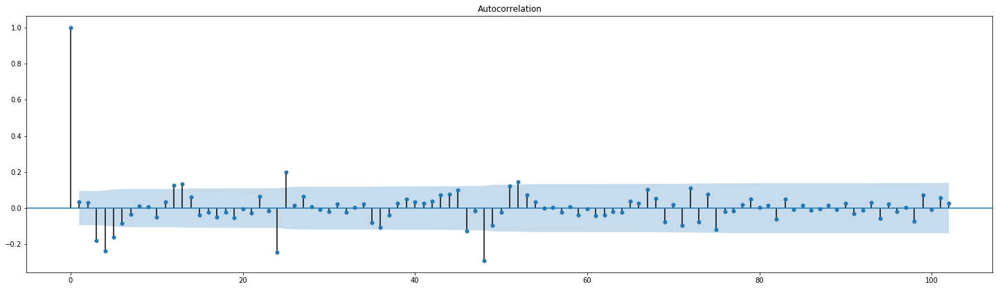

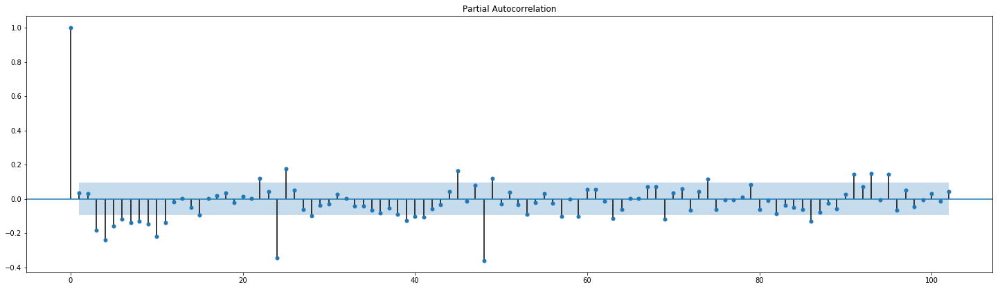

In [490]:
plt.figure(figsize(25,15))
ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(bike_rent_data_extended['count_lg241'][season_lag+1:].values, lags=102, ax=ax)
pylab.show()
ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(bike_rent_data_extended['count_lg241'][season_lag+1:].values, lags=102, ax=ax)
pylab.show()

Q*S = 48, Q = 2  
q = 13  
Q*P = 48, P = 2  
p = 11

---  
Попробуем построить рег-арму с такими параметрами не делая перебор и посмотрим на результаты


In [528]:
%%time
reg_arma_lg_model = sm.tsa.statespace.SARIMAX(np.log(bike_rent_data_train['count']),
                                              exog = bike_rent_data_train[exog_features].as_matrix(),
                                              order = (11, d, 13),
                                              seasonal_order = (2, D, 2, 24),
                                              measurement_error=False).fit(disp=-1)

CPU times: user 12min 47s, sys: 3.35 s, total: 12min 51s
Wall time: 3min 16s


In [529]:
# делаем предсказание на неделю впреред
predict_regarma_lg = reg_arma_lg_model.predict(start = bike_rent_data_test.index[0],\
                                               end = bike_rent_data_test.index[-1], \
                                               dynamic = False,\
                                               exog = bike_rent_data_test[exog_features].as_matrix())

In [530]:
predict_regarma_lg = np.exp(predict_regarma_lg)

In [531]:
display_quality_metrics(bike_rent_data_test['count'].values, predict_regarma_lg)

R2 = -1.48% 
MAE = 149.9
Mean(count) = 253.6 


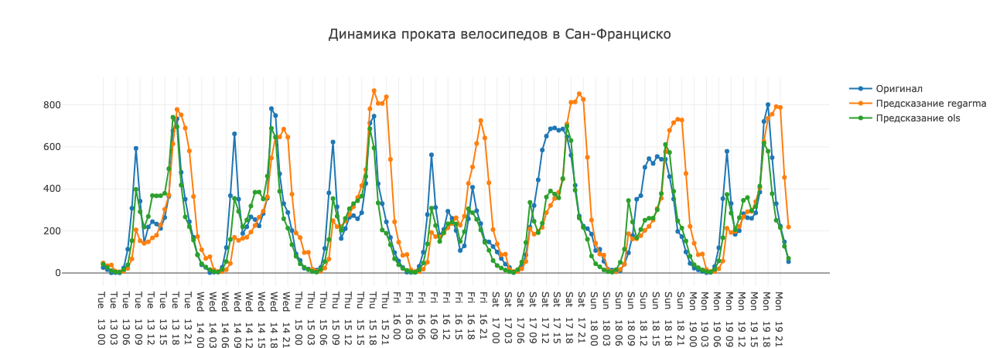

In [532]:
xax_with_weekday = bike_rent_data_test['datetime'].apply( lambda x: x.strftime("%a \n %d %H"))
fig = go.Figure(data=[go.Scatter(x = xax_with_weekday, y = bike_rent_data_test['count'], name='Оригинал', mode='markers+lines'),\
                      go.Scatter(x = xax_with_weekday, y = predict_regarma_lg, name='Предсказание regarma', mode='markers+lines'),\
                      go.Scatter(x = xax_with_weekday, y = ols_predict,\
                                name='Предсказание ols', mode='markers+lines')],
                layout = timed_layout)
iplot(fig)

In [533]:
from telegram import Bot

In [534]:
! echo "{\"token\":\"200312053:AAGViKHKxXRN4rqaiFy45o0HcCl2jFE18OQ\",\"id\":202849920}" > telegram.conf

In [536]:
import json

In [538]:
with open('telegram.conf','r') as file:
    teleconf = json.load(file)

In [543]:
bot = Bot(teleconf.get('token'))
def notify(message):
    bot.send_message(teleconf.get('id'),"%s"%message)

In [544]:
notify('test message')

In [435]:
ps = range(0, 10)
Ps = range(0, 4)

d, D = 1, 1

qs = range(0, 11)
Qs = range(0, 3)

In [176]:
from itertools import product
from tqdm import tqdm
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

1320

In [546]:
bike_rent_data_extended.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,date,weekday,hour,Mon,Tue,Wed,Thu,Fri,Sat,Sun,hour_0,hour_1,hour_2,hour_3,hour_4,hour_5,hour_6,hour_7,hour_8,hour_9,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,weather_1,weather_2,weather_3,count_bxcx,count_lg,count_lg24,count_lg241,count_lg2424,count_lg24121,count_lg24241
0,2012-03-01 00:00:00,1,0,1,2,17.22,21.210,94,0.0000,1,10,11,2012-03-01,3,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,3.855919,2.397895,NaN,NaN,NaN,NaN,NaN
1,2012-03-01 01:00:00,1,0,1,3,18.86,22.725,94,7.0015,0,12,12,2012-03-01,3,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.070204,2.484907,NaN,NaN,NaN,NaN,NaN
2,2012-03-01 02:00:00,1,0,1,2,18.86,22.725,94,19.0012,0,6,6,2012-03-01,3,2,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2.539753,1.791759,NaN,NaN,NaN,NaN,NaN
3,2012-03-01 03:00:00,1,0,1,1,18.86,22.725,94,15.0013,0,3,3,2012-03-01,3,3,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.354813,1.098612,NaN,NaN,NaN,NaN,NaN
4,2012-03-01 04:00:00,1,0,1,1,19.68,23.485,88,12.9980,0,5,5,2012-03-01,3,4,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2.198125,1.609438,NaN,NaN,NaN,NaN,NaN


In [549]:
print(*ols_columns2)

temp weather_1 weather_2 weather_3 Mon Tue Wed Thu Fri Sat Sun hour_0 hour_1 hour_2 hour_3 hour_4 hour_5 hour_6 hour_7 hour_8 hour_9 hour_10 hour_11 hour_12 hour_13 hour_14 hour_15 hour_16 hour_17 hour_18 hour_19 hour_20 hour_21 hour_22 hour_23


In [553]:
!pwd

/Users/sergei/Nextcloud/Personal/IoT/jupiter/TimeSeries
